In [1]:
#6学習に関するテクニック

#・最適な重みぱらめーた探索
#・重みパラメータ初期化
#・ハイパーパラメータ設定
#・過学習の為の対応策
#等が上記のテーマ

#61：ぱらめーたupdate
#ニューラルネットワーク学習の目的
#・損失関数の値を出来るだけ小さくするパラメータを見つける事→これを最適化（optimization）と言っている。
#そのパラメータを見つける手段として勾配を使って最適化している。
#その一つに確率的勾配下降法（stochnastic gradient descent)がある

#612：SGD（確率的勾配下降法)
# W ←　W - η∂L/∂W

# 更新する重みぱらめーたはW
#　Wに関する損失関数の勾配を∂L/∂W
#　ηは学習係数。実際は0.01,0.001という値を更新する。
#SGDは勾配方向へある言って映の距離だけ進むという単純な方法。

In [2]:
class SGD:
    def __Init__(self,lr=0.01):
        self.lr = lr

    def update(self, params, grads):
        for key in params.key():
            params[key] -= self.lr * grads[key]

In [3]:
#lrはlearning rate(学習係数の意味)。インスタンス変数として保持。
#update(self, params, grads)のparams, gradsは辞書（ディクショナリ）変数で、params['W1'] -= self.lr * grads['W1']とそれぞれに
#重みと勾配が格納されていく。
#そしてそれを更新していく。

#実際これでは動かないけれどPickupとして。

#network = TwoLayerNet(…)
#optimizer = SGD()

#for i in range(10000):
#    …
#    x.batch, t_batch = get_mini_batch(…)　#mini_batch
#    grads = network.gradient(x_batch, t_batch)
#    params = network.params
#    optimizer.update(params, grads)
#    …

#optimizer.update(params, grads)　ここのoptimizarで最適化を行う
#optimizer.update(params, grads)　つまり、此処がキーとして更新がおこなわれ勾配情報を最適化していく。
#optimizer = SGD() とあるけれど、後程出てくるmoment()等切り替えが可能である。
#前も出ていたように、一つずつクラスというレイヤーを作っていって、それをもう一回クラスとして纏め呼び出し、一気に計算する。

#今はあくまでもルール導入設定を行っているのみ。パーツになるのだなと考えておけばいい。　
#こういう考えって多分英語が一つずつの単語から文章を創り出すようになっているから、その意識に辿り着きやすいのだと思う。
#日本語は綺麗だし分かりやすいとも思うし繊細。それでも一つの文章として流れやすいので部分として捉えにくいのだと思う。

In [4]:
#本もそうだし、色々なモノに関してそうだけれど、わかっている人が書いている文章が抜け落ちる点というのは、
#それを本当に理解して進んでくれているかという、可視化である。
#此処でもすっと確率的勾配下降法が出てきたけれど、新しいテーマだと思ってしがいがちである。
#もう少し進めていく。

#613 SGD欠点
#f(x,y) = 1/20x^2 + y^2  ｆ：インテグラル (integral). 一般名称. 積分法 · 整数 · 全体・総体・完全; 積分記号 (∫); 整数型.

In [1]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib.animation as anm
import numpy as np
%matplotlib inline

def func1(x, y):
    return (1/20*x**2) + (y**2)

x = np.arange(-10, 10, 0.2)
y = np.arange(-10, 10, 0.2)

X, Y = np.meshgrid(x, y)
Z = func1(X, Y)

fig = plt.figure(figsize=(100, 100))
ax = Axes3D(fig)

ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("f(x, y)")

ax.plot_wireframe(X, Y, Z)
plt.show()

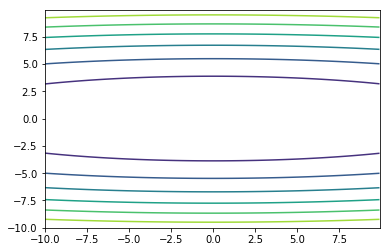

In [3]:
import numpy as np
import matplotlib.pyplot as plt

def func1(x, y):
    return (1/20*x**2) + (y**2)
 
x = np.arange(-10, 10, 0.1) # x軸
y = np.arange(-10, 10, 0.1) # y軸
 
X, Y = np.meshgrid(x, y)
Z = func1(X, Y)
 
cont = plt.contour(X, Y, Z)
plt.show()

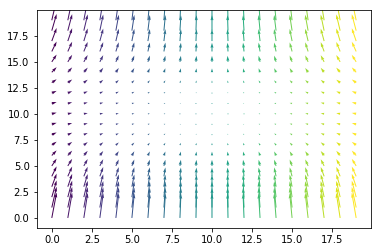

In [26]:
import matplotlib.pyplot as plt
import matplotlib.animation as anm

def partial_diff_x(x, y):
    return (1/20*x**2) + (y**2)

# グリッドデータ作成
x = np.arange(-5, 5, 0.5)
y = np.arange(-5, 5, 0.5)
X, Y = np.meshgrid(x, y)

# 偏微分の計算
partial_diff_x_matrix = partial_diff_x(X, Y)
partial_diff_y_matrix = partial_diff_y(X)

# 描写
plt.quiver(-X, partial_diff_x_matrix, partial_diff_y_matrix) # ←矢印の方向は下降の場合「-X」、上方の場合は[X]

plt.show()

In [ ]:
#上記
#f(x,y) = 1/20x^2 + y^2  ｆ：インテグラル (integral). 一般名称. 積分法 · 整数 · 全体・総体・完全; 積分記号 (∫); 整数型.
#これをBI化するとこうなる。探索位置は(x, y)=(-7, 2)
#

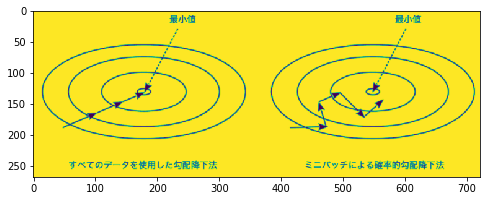

In [3]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
%matplotlib inline

img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch001.png')
plt.figure(figsize=(8, 8)) # figureの縦横の大きさ
plt.imshow(img)

plt.show()

In [4]:
#此処までずれるってのはないけれど、データをランダム取得するわけだからそうなる。
#本当はanimationでしたかったけれど…。
#どちらにしても勾配法なんだから、ジグザグになる。
#それを改善できないものかとするものがmometum

#614：Momentum（勢い）
#運動量という意味の言葉で、物理に関係があります。

#v ← αv - η∂L/∂W

#確率的勾配降下法（stochastic gradient descent）が。

# W ←　W - η∂L/∂W

# 更新する重みぱらめーたはW
#　Wに関する損失関数の勾配を∂L/∂W
#　ηは学習係数。実際は0.01,0.001という値を更新する。

#こうで、αv → α
#v→velocity　速度
#勾配方向に物体方向に加速させるって感じ？
#momentiumのイメージ：ボールが地面の傾斜を転がるように動くイメージ
#αvは物体が何も力を受けない時に徐々に減速する。α=0.09とか、抵抗。

In [6]:
class Momentum:
    def __init__(self,lr = 0.01, moentum = 0.9):
        self.lr = lr #learning rate
        self.momentum = momentum
        self.v = None

    def partial_diff_x(x, y):
    return (1/20*x**2) + (y**2)

    def update(self, params, grads):
        if self.v is None:
            self.v = {}
            for key, val in params.items():
                self.v[key] = np.zeros_like(val)

        for key in params.keys():
            selfv[key] = self.momentum.v[key] = self.lr*grads[key]
            params[key] += self.v[key]

In [8]:
#v：インスタンス変数は物体の速度を保持。初期値は勿論０．何故ならそのものを動かして速度が産まれるから。
#update():パラメータと勾配が呼ばれ、その構造データをディクショナリ変数として保持する
#grads→gradient：勾配
#param→parameter:パラメータ―

#network = TwoLayerNet(…)
#optimizer = SGD()

#for i in range(10000):
#    …
#    x.batch, t_batch = get_mini_batch(…)　#mini_batch
#    grads = network.gradient(x_batch, t_batch)
#    params = network.params
#    optimizer.update(params, grads)
#    …

#後でやる可能性が高そうね…。
#今はあくまでもルール導入設定を行っているのみ。パーツになるのだなと考えておけばいい。　

In [9]:
#615 AdaGrad
#Ada：適応力の意味。

#6学習に関するテクニック

#・最適な重みぱらめーた探索
#・重みパラメータ初期化
#・ハイパーパラメータ設定
#・過学習の為の対応策
#等が上記のテーマ

#SGD（確率的勾配下降法)
# W ←　W - η∂L/∂W
#Momentum（勢い）
#v ← αv - η∂L/∂W

#今回のテーマは過学習
#学習係数（数式でη）の値が重要となる。
#このηが大きいと数が散らばるかな、正しい学習が行えない、少ないと学習に時間が掛かる
#η、学習係数の学習係数の減衰（learning rate decacy)という方法がある
#学習が進むにつれ、この係数が小さくなる
#最初は大きくして。小さくする。ニューラルネットワークの学習では実際によく使われる。

#このアイディアはパラメータ「全体」の学習経緯数の値を一括で下げるって事に相当する。
#Adagradは個々のパラメータに対して、オーダーメイド、各要素ごとに適応的に学習係数を調整しながら学習を行う

# h ←　h + ∂L/∂WΘ∂L/∂W #Θ→本当は〇の中に点で行列ごとの掛け算の事
# W ←　W - η 1/√h *∂L/∂W

#h：updateした勾配の値を2乗和として保持する。
#1/√h　にて乗算する事で、学習幅を調整する。
#パラメータの要素の中で大きく更新された要素は学習係数が小さくなることを意味する

#実際にupdateしまくれば0になってしまう。
#もう一つ、RMSProp[7]という方法がある。
#RMSPropという方法がある。これは過去の勾配をdeleteして新しいupdateを上書きしていく
#専門的に指数移動平均という。過去の勾配のスケールを減少させる。


In [2]:
class AdaGrad:
    def __init__(self, lr=0.01):
        self.lr = lr
        self.h = None

    def update(self, params, grads):
        if self.h is None:
        self.h = ()
        for key, val in params.items():
            self.h[key] = np.zeros_like(val)

    for key in params.keys():
        self.h[key] += grad[key] * grads[key]
        params[key] -= self.lr * grads[key] / (np.sqrt(self.h[key]) + le-7)
        

IndentationError: expected an indented block (<ipython-input-2-6f99299ddb7a>, line 8)

In [3]:
class AdaGrad:
    def __init__(self, lr=0.01):
        self.lr = lr
        self.h = None

    def update(self, params, grads):
        if self.h is None:
        self.h = {}
        for key, val in params.items():
            self.h[key] = np.zeros_like(val)

    for key in params.keys():
        self.h[key] += grad[key] * grads[key]
        params[key] -= self.lr * grads[key] / (np.sqrt(self.h[key]) + le-7)

IndentationError: expected an indented block (<ipython-input-3-cb397a18bd03>, line 8)

In [6]:
class AdaGrad:
    def __init__(self, lr = 0.01):
        self.lr = lr
        self.h = None

    def update(self, params, grads):
        if self.h is None:
            self.h = {}
            for key, val in params.items():
                self.h[key] = np.zeros_like(val)

        for key in params.keys():
            self.h[key] += grad[key] * grads[key]
            params[key] -= self.lr * grads[key] / (np.sqrt(self.h[key]) + le-7)

In [7]:
#IndentationError：インデントブロックが必要です　（字下げが必要
#params[key] -= self.lr * grads[key] / (np.sqrt(self.h[key]) + le-7)
#此処でle-7を使っているのは除算してしまった場合0になってしまった時、それを防ぐ意味がある。

#とりあえず、図だけを見せるのはどうかって思うな…。

#まぁとりあえず、勾配によるジグザグを解消するための計算式がこれだ。
#最小値に向かってステップが緩やかになっていく

In [1]:
#616_Adam
#Adaは適応的のAdaptiveで学習係数の減衰を発生させることで、勾配の無駄を減衰させる。
#Momentamは勾配のジグザグ感をお椀にボールを入れる事で物理加速がゆっくりになるように抑える。
#Adamは　Ada+Momentam　＝　Adamになる

#2015年に完成した比較的新しい手法。
#その為、さらっとしか書かないのは日本の筆者か？まぁいいや。
#パラメータ空間を探索する事を期待して作った手法。
#ハイパーパラメータのバイアス補正（偏りの補正）が行われる。
#と書いていたが、原著を読んでくれって最後に来たのは草。

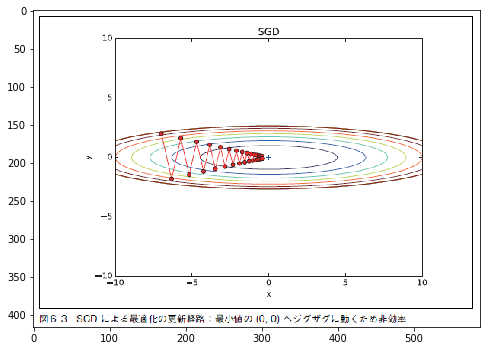

In [2]:
#617：update方法。

import matplotlib.pyplot as plt
from matplotlib.image import imread
%matplotlib inline

img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch003.png')
plt.figure(figsize=(8, 8)) # figureの縦横の大きさ
plt.imshow(img)

plt.show()

SGD

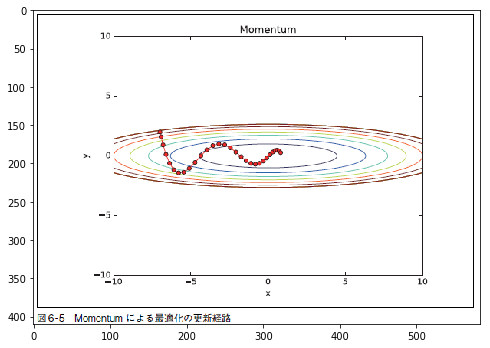

In [3]:
img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch005.png')
plt.figure(figsize=(8, 8)) # figureの縦横の大きさ
plt.imshow(img)

plt.show()

Momentum

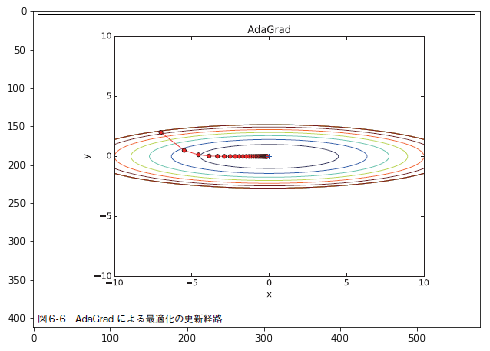

In [4]:
img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch006.png')
plt.figure(figsize=(8, 8)) # figureの縦横の大きさ
plt.imshow(img)

plt.show()

Adagard

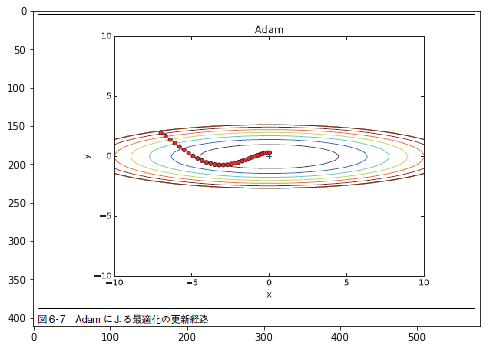

In [5]:
img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch007.png')
plt.figure(figsize=(8, 8)) # figureの縦横の大きさ
plt.imshow(img)

plt.show()

Adam

In [1]:
#Mnist datasetによる比較。

#SGDが一番遅いよねって証明したいだけのものだけれど、とりあえずやっておくこと。
#adamも含めて。


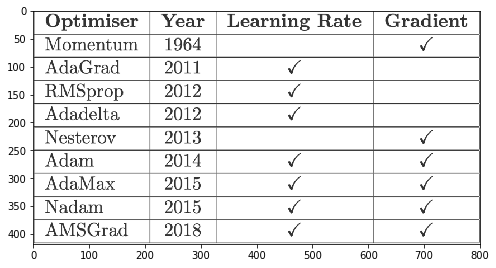

In [2]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
%matplotlib inline

img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch008.png')
plt.figure(figsize=(8, 8)) # figureの縦横の大きさ
plt.imshow(img)

plt.show()

In [3]:
#Adamを始める前に確率的勾配下降法
#1964年にMomentumが見つかってから、そこからは1年ごとに見つかっている。
#これは恐らくビッグデータを活用しようとこの頃から始まっていたのだろうな…。
#Gradient：勾配
#Learning rate：学習率

#今回学ぶのはAdam。2014年に産まれ、学習率と勾配をミックスさせたものだ。上を見るとね。
#勾配降下は関数の最小値を見つけるための最適化方法になる
#これはバックプロ下―ション（逆伝播）によってニューラルネットワークの重みを更新するため、
#ディープラーニングでは一般的に利用される

#勾配降下を最適化する理由は主に3つ
#・学習率成分αを修正することが可能
#・勾配成分∂L/∂Wを修正する
#・上記両方

#学習率スケジューラーと勾配降下最適化
#上記2つの違いは勾配降下最適化は学習率に勾配の関数である係数を掛ける事で学習率成分を適応させるのに対し、
#学習率スケジューラは学習率に定数又は関数である係数を掛ける事である。

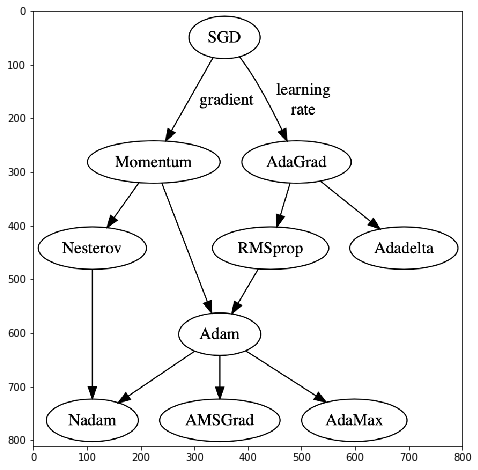

In [4]:
img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch009.png')
plt.figure(figsize=(8, 8)) # figureの縦横の大きさ
plt.imshow(img)

plt.show()

In [5]:
#今の所Adam迄とする。

#Adamの名前の由来
#Adaptive moment estimation

#AdagradとRMSPropの掛け合わせ
#AdaGradはSparse Gradientに強い。（しかし一時モーメントのバイアス訂正項がないからバイアスは大きくなるし、
#パラメーターの更新も大きくなる）
#RMSPropはオンラインで非定常な設定で強い（しかしバイアス訂正項が小さな値になるとstep sizeが大きくなる)
#初期値を与える必要有。ハイパーパラメータの設定は悩まなくていい
#nozyでsparseな勾配に強い、蜜な勾配にも強い、reget bound付き

#アルゴリズム
#・効率のいいstep sizeを計算したい
#・パラメータupdate方式の手続きに勾配の一時モーメント（平均）と
#二次モーメント（分散）の指数移動平均を導入している
#・一時モーメントと二次モーメントの初期値（=0)のバイアスが入ってしまうのでバイアス訂正項を考える
#・バイアス訂正は平滑化係数を使用して行う
#・勾配のスケールは一時モーメントと二次モーメントの比較によってキャンセルされる為、step sizeが安定する
#・学習係数のupdateも自動化できる



===========iteration:0===========
SGD:2.32781878417801
Momentum:2.3285424755112762
AdaGrad:2.0778336936308115
Adam:2.2000883513025546
===========iteration:100===========
SGD:1.6888699115098897
Momentum:0.2694291595005658
AdaGrad:0.09526199520448478
Adam:0.18539011765476782
===========iteration:200===========
SGD:0.8597967060292977
Momentum:0.26443006118544743
AdaGrad:0.10853261319264476
Adam:0.15997368603594767
===========iteration:300===========
SGD:0.4412537364002923
Momentum:0.1498664333162819
AdaGrad:0.0472256128523309
Adam:0.1586811670483526
===========iteration:400===========
SGD:0.48081587215766075
Momentum:0.17346324067309626
AdaGrad:0.12689116156293911
Adam:0.15657315026720464
===========iteration:500===========
SGD:0.32624586809543465
Momentum:0.08522166188899596
AdaGrad:0.029717482030529072
Adam:0.04918345503195867
===========iteration:600===========
SGD:0.313676746790681
Momentum:0.10745727295545167
AdaGrad:0.03476276852578712
Adam:0.031432729423374384
===========iteration:

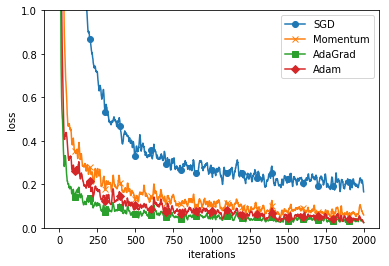

In [6]:
# coding: utf-8
import os
import sys
sys.path.append(os.pardir)  # 親ディレクトリのファイルをインポートするための設定
import matplotlib.pyplot as plt
from dataset.mnist import load_mnist
from common.util import smooth_curve
from common.multi_layer_net import MultiLayerNet
from common.optimizer import *


# 0:MNISTデータの読み込み==========
(x_train, t_train), (x_test, t_test) = load_mnist(normalize=True)

train_size = x_train.shape[0]
batch_size = 128
max_iterations = 2000


# 1:実験の設定==========
optimizers = {}
optimizers['SGD'] = SGD()
optimizers['Momentum'] = Momentum()
optimizers['AdaGrad'] = AdaGrad()
optimizers['Adam'] = Adam()
#optimizers['RMSprop'] = RMSprop()

networks = {}
train_loss = {}
for key in optimizers.keys():
    networks[key] = MultiLayerNet(
        input_size=784, hidden_size_list=[100, 100, 100, 100],
        output_size=10)
    train_loss[key] = []    


# 2:訓練の開始==========
for i in range(max_iterations):
    batch_mask = np.random.choice(train_size, batch_size)
    x_batch = x_train[batch_mask]
    t_batch = t_train[batch_mask]
    
    for key in optimizers.keys():
        grads = networks[key].gradient(x_batch, t_batch)
        optimizers[key].update(networks[key].params, grads)
    
        loss = networks[key].loss(x_batch, t_batch)
        train_loss[key].append(loss)
    
    if i % 100 == 0:
        print( "===========" + "iteration:" + str(i) + "===========")
        for key in optimizers.keys():
            loss = networks[key].loss(x_batch, t_batch)
            print(key + ":" + str(loss))


# 3.グラフの描画==========
markers = {"SGD": "o", "Momentum": "x", "AdaGrad": "s", "Adam": "D"}
x = np.arange(max_iterations)
for key in optimizers.keys():
    plt.plot(x, smooth_curve(train_loss[key]), marker=markers[key], markevery=100, label=key)
plt.xlabel("iterations")
plt.ylabel("loss")
plt.ylim(0, 1)
plt.legend()
plt.show()


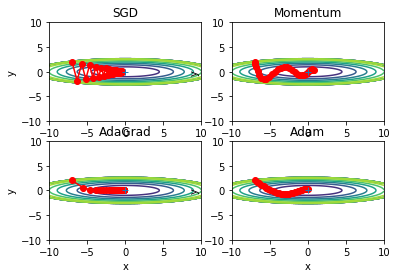

In [7]:
# coding: utf-8
import sys, os
sys.path.append(os.pardir)  # 親ディレクトリのファイルをインポートするための設定
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict
from common.optimizer import *


def f(x, y):
    return x**2 / 20.0 + y**2


def df(x, y):
    return x / 10.0, 2.0*y

init_pos = (-7.0, 2.0)
params = {}
params['x'], params['y'] = init_pos[0], init_pos[1]
grads = {}
grads['x'], grads['y'] = 0, 0


optimizers = OrderedDict()
optimizers["SGD"] = SGD(lr=0.95)
optimizers["Momentum"] = Momentum(lr=0.1)
optimizers["AdaGrad"] = AdaGrad(lr=1.5)
optimizers["Adam"] = Adam(lr=0.3)

idx = 1

for key in optimizers:
    optimizer = optimizers[key]
    x_history = []
    y_history = []
    params['x'], params['y'] = init_pos[0], init_pos[1]
    
    for i in range(30):
        x_history.append(params['x'])
        y_history.append(params['y'])
        
        grads['x'], grads['y'] = df(params['x'], params['y'])
        optimizer.update(params, grads)
    

    x = np.arange(-10, 10, 0.01)
    y = np.arange(-5, 5, 0.01)
    
    X, Y = np.meshgrid(x, y) 
    Z = f(X, Y)
    
    # for simple contour line  
    mask = Z > 7
    Z[mask] = 0
    
    # plot 
    plt.subplot(2, 2, idx)
    idx += 1
    plt.plot(x_history, y_history, 'o-', color="red")
    plt.contour(X, Y, Z)
    plt.ylim(-10, 10)
    plt.xlim(-10, 10)
    plt.plot(0, 0, '+')
    #colorbar()
    #spring()
    plt.title(key)
    plt.xlabel("x")
    plt.ylabel("y")
    
plt.show()

In [9]:
# coding: utf-8
import numpy as np

class SGD:

    """確率的勾配降下法（Stochastic Gradient Descent）"""

    def __init__(self, lr=0.01):
        self.lr = lr
        
    def update(self, params, grads):
        for key in params.keys():
            params[key] -= self.lr * grads[key] 


class Momentum:

    """Momentum SGD"""

    def __init__(self, lr=0.01, momentum=0.9):
        self.lr = lr
        self.momentum = momentum
        self.v = None
        
    def update(self, params, grads):
        if self.v is None:
            self.v = {}
            for key, val in params.items():                                
                self.v[key] = np.zeros_like(val)
                
        for key in params.keys():
            self.v[key] = self.momentum*self.v[key] - self.lr*grads[key] 
            params[key] += self.v[key]


class Nesterov:

    """Nesterov's Accelerated Gradient (http://arxiv.org/abs/1212.0901)"""

    def __init__(self, lr=0.01, momentum=0.9):
        self.lr = lr
        self.momentum = momentum
        self.v = None
        
    def update(self, params, grads):
        if self.v is None:
            self.v = {}
            for key, val in params.items():
                self.v[key] = np.zeros_like(val)
            
        for key in params.keys():
            self.v[key] *= self.momentum
            self.v[key] -= self.lr * grads[key]
            params[key] += self.momentum * self.momentum * self.v[key]
            params[key] -= (1 + self.momentum) * self.lr * grads[key]


class AdaGrad:

    """AdaGrad"""

    def __init__(self, lr=0.01):
        self.lr = lr
        self.h = None
        
    def update(self, params, grads):
        if self.h is None:
            self.h = {}
            for key, val in params.items():
                self.h[key] = np.zeros_like(val)
            
        for key in params.keys():
            self.h[key] += grads[key] * grads[key]
            params[key] -= self.lr * grads[key] / (np.sqrt(self.h[key]) + 1e-7)


class RMSprop:

    """RMSprop"""

    def __init__(self, lr=0.01, decay_rate = 0.99):
        self.lr = lr
        self.decay_rate = decay_rate
        self.h = None
        
    def update(self, params, grads):
        if self.h is None:
            self.h = {}
            for key, val in params.items():
                self.h[key] = np.zeros_like(val)
            
        for key in params.keys():
            self.h[key] *= self.decay_rate
            self.h[key] += (1 - self.decay_rate) * grads[key] * grads[key]
            params[key] -= self.lr * grads[key] / (np.sqrt(self.h[key]) + 1e-7)


class Adam:

    """Adam (http://arxiv.org/abs/1412.6980v8)"""

    def __init__(self, lr=0.001, beta1=0.9, beta2=0.999):
        self.lr = lr
        self.beta1 = beta1
        self.beta2 = beta2
        self.iter = 0
        self.m = None
        self.v = None
        
    def update(self, params, grads):
        if self.m is None:
            self.m, self.v = {}, {}
            for key, val in params.items():
                self.m[key] = np.zeros_like(val)
                self.v[key] = np.zeros_like(val)
        
        self.iter += 1
        lr_t  = self.lr * np.sqrt(1.0 - self.beta2**self.iter) / (1.0 - self.beta1**self.iter)         
        
        for key in params.keys():
            #self.m[key] = self.beta1*self.m[key] + (1-self.beta1)*grads[key]
            #self.v[key] = self.beta2*self.v[key] + (1-self.beta2)*(grads[key]**2)
            self.m[key] += (1 - self.beta1) * (grads[key] - self.m[key])
            self.v[key] += (1 - self.beta2) * (grads[key]**2 - self.v[key])
            
            params[key] -= lr_t * self.m[key] / (np.sqrt(self.v[key]) + 1e-7)
            
            #unbias_m += (1 - self.beta1) * (grads[key] - self.m[key]) # correct bias
            #unbisa_b += (1 - self.beta2) * (grads[key]*grads[key] - self.v[key]) # correct bias
            #params[key] += self.lr * unbias_m / (np.sqrt(unbisa_b) + 1e-7)


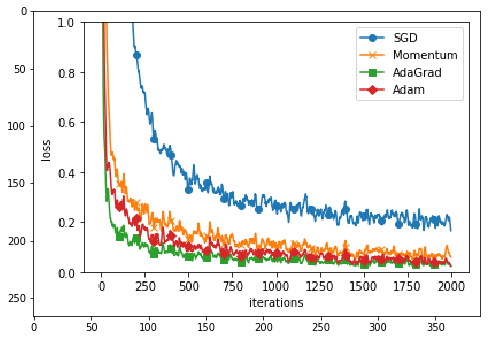

In [1]:
#62 重みの初期値

#・最適な重みぱらめーた探索
#・重みパラメータ初期化
#・ハイパーパラメータ設定
#・過学習の為の対応策
#等が上記のテーマ

#そうこれまでやってたのは！！！最適な重みパラメータです…
#次は重みパラメータ初期化。

import matplotlib.pyplot as plt
from matplotlib.image import imread
%matplotlib inline

img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch010.png')
plt.figure(figsize=(8, 8)) # figureの縦横の大きさ
plt.imshow(img)

plt.show()

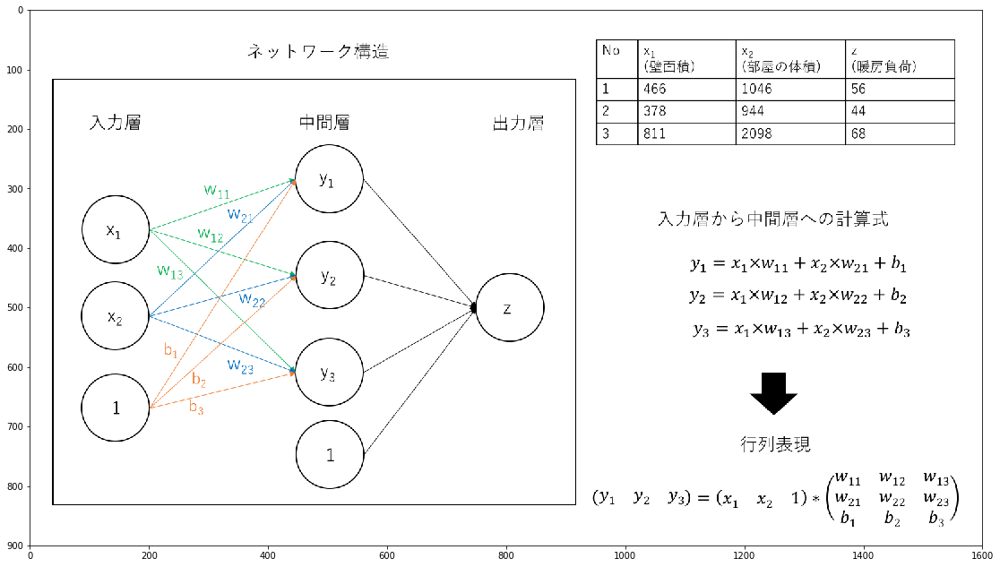

In [5]:
#621　重みの初期値を0にする。

#過学習を抑え、汎化性能を高めるテクニック。Weight decay(加重減衰）。
#Weight decay(加重減衰）,重みパラメータを減衰する。そのままだね。
#それを行う事で、過学習を減らす

#重みを小さくする。
#最初に戻ると、これ。

img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch012.png')
plt.figure(figsize=(50, 11))
plt.imshow(img)

plt.show()

In [6]:
#入力層と中間層にある間のWを小さくすることが目的になるのだけれど、
#例えば重み初期値。
#0.01*np.random.randn(10,100)のようにガウス分布から生成される値を0.01倍したな値
#※標準偏差が0.01のガウス分布を用いた。
#重みの値を小さくしたいのなら初期値もういらないんじゃね？って発想はどうだろう？
#ってアホか…。

#0でも均一でも駄目。それだとどっちもオール一緒。
#ニューラルネットワークを数値を変える事によってルートが変わるものだ。

In [7]:
#622　隠れ層（活性化関数の出力層、つまり中間層の事）のアクティベーション分布

#此処では重みの初期値によって隠れ層のアクティベーションがどのように変化するか？
#・5層ニューラルネットワーク（活性化関数にはsigmoid関数を利用する)
#・ランダム生成した入力データを流して、アクティベーションデータ分布をヒストグラムで書く！
#・CS231ｎ、スタンフォード大学、授業を参考にしている。一部です。一部！？？？？？雑だ…。

import numpy as np
import matplotlib.pyplot as plt

def sigmoid(x):
    return 1 / (1 + np.exp(-x))
x = np.random.randn(1000, 100) #1000個のデータ
node_num = 1000                #各隠れ層のノード数（ニューロン）
hidden_layer_size = 5          #隠れ層:5層
activations = {}               #此処にアクティベーション結果を格納する

for i in range(hidden_layer_size):
    if i != 0:
        w = np.random.randn(node_num, node_num) = * 1
        z = np.dot(x, w)
        a = sigmoid(z)
        activations[i] = a

SyntaxError: can't assign to function call (<ipython-input-7-7030758b09fe>, line 20)

In [8]:
#SyntaxError: can't assign to function call
#SyntaxError：関数呼び出しに代入できない

#そりゃfunction:sigmoidがないからなー。
#・5層
#・100個のニューロンを持つ
#・入力データとして、それぞれ1000個のデータをガウス分布でランダムに生成する
#・活性化関数：sigmoid
#・各層アクティベーション結果：activationsという変数
#・注目点は重みスケール
#・今回、標準偏差が1のガウス分布を用いているが、この標準偏差（スケール）を変える事で、
#アクティベーションの分布がどのように変化するかを観察することが、この実験の目的。
#・activationsに格納された各層のデータをヒストグラムとして描画してみる

#・ヒストグラム描画
for i, a in actibations.items():
    plt.subplot(1, len(activations), i+1)
    plt.titles(str(i+1) + "-layer")
    plt.hist(a.flatten(), 30, range=(0,1))
plt.show    

NameError: name 'actibations' is not defined

In [9]:
#・ヒストグラム描画
for i, a in activations.items():
    plt.subplot(1, len(activations), i+1)
    plt.titles(str(i+1) + "-layer")
    plt.hist(a.flatten(), 30, range=(0,1))
plt.show  

NameError: name 'activations' is not defined

In [10]:
#NameError: name 'activations' is not defined
#NameError: "activations"って名前は定義されてないぜ！！

#・ヒストグラム描画
for i, a in activations.items():
    plt.subplot(1, len(activations), i+1)
    plt.titles(str(i+1) + "-layer")
    plt.hist(a.flatten(), 30, range=(0,1))
plt.show

NameError: name 'activations' is not defined

In [11]:
#コード実行するとヒストグラムを得られる
#各層のアクティベーションは0 and 1に偏った分布になっている
#sigmoidはS字カーブ関数がシグモイド関数の出力が0に近づくにつれ（or 1に近づくにつれ)その微分値は0に近づく
#その為、1と0に偏ったデータ分布では、逆伝播での勾配の値がどんどん小さくなって消える
#これを勾配消失（gradient vanishing)と呼ばれる問題である
#層を深くするディープラーニングでは、勾配消失は更に深刻な問題になり得る

#続いて重みの標準偏差を1→0.01として同じ実験を行う。
#これは初期設定を変更する事にある



In [12]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))
x = np.random.randn(1000, 100) #1000個のデータ
node_num = 1000                #各隠れ層のノード数（ニューロン）
hidden_layer_size = 5          #隠れ層:5層
activations = {}               #此処にアクティベーション結果を格納する

for i in range(hidden_layer_size):
    if i != 0:
#        w = np.random.randn(node_num, node_num) = * 1
        w = np.random.randn(node_num, node_num) = * 0.01
        z = np.dot(x, w)
        a = sigmoid(z)
        activations[i] = a

SyntaxError: can't assign to function call (<ipython-input-12-90e39eb0e54a>, line 11)

In [13]:
#0.5付近に集中する分布になる。
#先程の例のように0→1への偏りではなく、勾配消失の問題も起きない
#しかし、activationsに偏りがあり、表現力として問題がある

#活性化関数（かっせいかかんすう、英: activation function）もしくは伝達関数
#（でんたつかんすう、英: transfer function）とは、ニューラルネットワークにおいて、
#線形変換をした後に適用する非線形関数もしくは恒等関数のことである。

#此処で試している実験は
#・重みスケール,weight scaleの事で、標準偏差を1 or 0.01で実験
#・今回、標準偏差が1のガウス分布を用いているが、この標準偏差（スケール）を変える事で、
#アクティベーションの分布がどのように変化するかを観察することが、この実験の目的。
#・activationsに格納された各層のデータをヒストグラムとして描画してみる

#つまり。活性化関数の分布は適度な広がりを持つ事が求められ、
#各層を流れる事でニューラルネットワークの学習が効率的に行える。
#偏ったデータになった時、それはそう一方的な意見ではデータとして使えない。

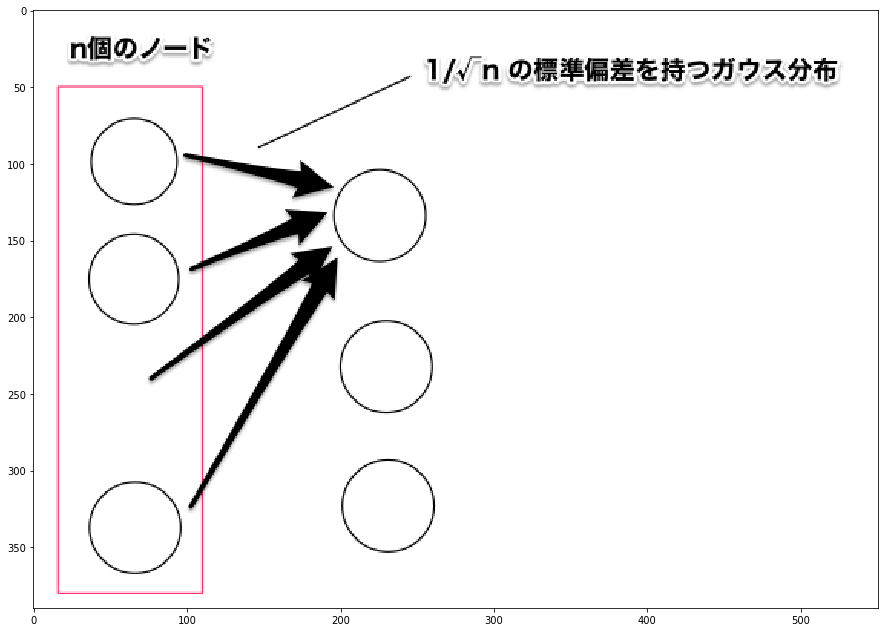

In [15]:
#Xavier Glorotらの論文で推奨される重みの初期値、
#「Xaivierの初期値」通称
#これはXaivier初期値設定を行いXaivierという引数を与えることを指す。
#利点：各レイヤーのactivation値を同じ広がりのある分布にする事を目的として、適切な重みのスケールを導く。
#前層のノードの個数をnとした場合、1/√nの標準偏差を持つ分布を使うというモノ

img = imread('D:/python/deeplearning/pycontent/dataset/learningtechnch013.png')
plt.figure(figsize=(50, 11))
plt.imshow(img)

plt.show()

In [ ]:
#「Xaivierの初期値」の利点：前層のノード数が大きいほど、
#対象ノードの初期値として設定する重みのスケールは小さくなる

node_num = 100 # 前層ノード

def sigmoid(x):
    return 1 / (1 + np.exp(-x))
x = np.random.randn(1000, 100) #1000個のデータ
node_num = 1000                #各隠れ層のノード数（ニューロン）
hidden_layer_size = 5          #隠れ層:5層
activations = {}               #此処にアクティベーション結果を格納する

for i in range(hidden_layer_size):
    if i != 0:
#        w = np.random.randn(node_num, node_num) = * 1
        w = np.random.randn(node_num, node_num) = nq.sqrt(node_num)
        z = np.dot(x, w)
        a = sigmoid(z)
        activations[i] = a

#「Xaivierの初期値」はいびつさが目立つが、層ごとに広がりを持っている事がわかる…？
#sigmoid関数の代わりにtanh関数（双曲線関数）を用いるといびつな形も変わる
#tanh関数を使用する事で綺麗な釣鐘型になる。
#tanh関数：原点（0,0）で対称なS字カーブ
#sigmoid関数：（x,y）=(0,0.5)で対称なS字カーブ
#活性化関数においては原点対象が望ましいとされる
